(c) Copyright 2023 Enzo Alexander Cording - https://github.com/EnzoCording - GNU GPL v3.0

This pipeline walks through the entire functionalities of FleetRL

1) Creating a custom use-case
    - Updating your data path
    - Changing environment settings if needed
    - Generating your own vehicle schedules
2) Training an RL agent
3) Building benchmark charging strategies
4) Comparing the RL agent to the benchmarks

This code could also be run in a .py file. Then, the code should be wrapped in:

    if __name__ == "__main__":
        #code here

**Importing dependencies**

In [42]:
import datetime as dt
import numpy as np
import math
import matplotlib.pyplot as plt
from typing import Literal
import pandas as pd
import time
import os

from fleetrl.fleet_env.fleet_environment import FleetEnv
from fleetrl.benchmarking.benchmark import Benchmark
from fleetrl.benchmarking.uncontrolled_charging import Uncontrolled
from fleetrl.benchmarking.distributed_charging import DistributedCharging
from fleetrl.benchmarking.night_charging import NightCharging
from fleetrl.benchmarking.linear_optimization import LinearOptimization

from fleetrl.agent_eval.evaluation import Evaluation
from fleetrl.agent_eval.basic_evaluation import BasicEvaluation

from stable_baselines3.common.vec_env import VecNormalize, SubprocVecEnv
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3 import PPO
from stable_baselines3.common.callbacks import EvalCallback, ProgressBarCallback, BaseCallback
from stable_baselines3.common.logger import HParam

from pink import PinkActionNoise
from stable_baselines3.common.noise import OrnsteinUhlenbeckActionNoise, NormalActionNoise

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

**Creating a custom use-case**
Go through this step by step and check the documentation if needed. The docs specify what type of input data is required, what format it should be in, etc.
The code below is commented to provide the most essential information.

Docs: fleetrl.readthedocs.io

**General settings**
Under general settings, you can adjust how many vehicles to optimize for, whether you would like to create new schedules how long the episodes should be, etc.
There is a pre-trained agent for the 1-EV environments. So you can give this a try before training your own agents and just benchmark performances and evaluate your environment. Once you are sure everything is set up correctly, increase the number of EVs and train your own agents.

In [37]:
# define fundamental parameters
# data path to inputs folder with schedule csv, prices, load, pv, etc.
input_data_path: str = "inputs"  # NOTE: either use "/" (linux) or "\\" (windows)
run_name: str = "Test_run_custom"  # Change this name or make it dynamic, e.g. with a timestamp
n_train_steps = 48  # number of hours in a training episode
n_eval_steps = 48  # number of hours in one evaluation episode
n_eval_episodes = 1  # number of episodes for evaluation
n_evs = 1  # number of evs
n_envs = 2  # number of envs parallel - has to be equal to 1, if train_freq = (1, episode) or default setting
time_steps_per_hour = 4  # temporal resolution
use_case: str = "custom"  # for file name - lmd=last mile delivery, by default can insert "lmd", "ct", "ut", "custom"
custom_schedule_name = "1_lkw.csv"  # name for custom schedule if you have generated one. If you want to generate one this time, this field will be ignored
scenario: Literal["arb", "tariff"] = "tariff"  # arbitrage or tariff. Arbitrage allows for bidirectional spot trading, no fees. Tariff models commercial tariff
gen_new_schedule = True  # generate a new schedule - refer to schedule generator documentation and adjust statistics in config.json
gen_new_test_schedule = True  # generate a new schedule for agent testing

real_time = False  # Experimental - leave False for now but in the future FleetRL will be able to handle real-time data with arbitrary time resolution

**Training settings**
These more low-level settings allow you to change training-related parameters. Refer to the documentation of FleetRL and stable-baselines3 for further details. Observations are by default normalized within SB3, due to their rolling average normalization. You can also conduct absolute normalization via FleetRL.

Adapt total training steps and saving interval for a full run.

In [38]:
# training parameters
norm_obs_in_env = False  # normalize observations within FleetRL (max, min normalization)
vec_norm_obs = True  # normalize observations in SB3 (rolling normalization)
vec_norm_rew = True  # normalize rewards in SB3 (rolling normalization)

# Total steps should be sep to 1e6 or 5e6 for a full run. Check tensorboard for stagnating reward signal and stop training at some point to avoid overfit
total_steps = int(1e3)  # total training time steps

# Specifies how often you want to make an intermediate artifact. For a full run, I recommend every 50k - 100k steps, so you can backtrack for best model
saving_interval = 5e2  # interval for saving the model

**Parameters for environment object creation**
Further settings can be adjusted below, view the comments and docs for more detailed explanations.
Most important:
- Episode length: How long an episode is in hours - at least 36 hours are recommended so the agent always sees one passage of a night for night charging
- include_building, include_pv, include_price: These adjust the shape of the observations to make the problem simpler or more complex
- price_lookahead, bl_pv_lookahead: These dictate how much knowledge into the future the agent has on price, building load and PV in hours
- Time picker: Use random during training: This way, a new episode always starts at a random point in the dataframe
- Deg_emp: For simple degradation, set to True
- Ignore_x_reward: Set accordingly with Include_x... or deactivate certain parts of the reward function to adjust problem complexity

In [39]:
# environment arguments - adjust settings if necessary
# additional settings can be changed in the config files
env_config = {"data_path": input_data_path,
              # Specify file names: there is a naming convention for default files, otherwise, custom name is used
              "schedule_name": (str(n_evs) + "_" + str(use_case) + ".csv") if use_case != "custom" else custom_schedule_name,
              "building_name": "load_" + str(use_case) + ".csv" if use_case != "custom" else "load_lmd.csv",
              "pv_name": None,  # if separate file for PV inputs, specify here, otherwise, uses "PV" column in building_name
              # Define use case
              "use_case": use_case,
              # Change observation space
              "include_building": True,  # False removes building load from Observation
              "include_pv": True,  # False removes PV from Observation
              "include_price": True,  # False removes electricity prices from Observation
              "price_lookahead": 8,  # Hours seen into the future
              "bl_pv_lookahead": 4,  # Hours seen into the future
              "time_steps_per_hour": 4,  # Time resolution
              # Specify time picker: "eval", "static", or "random" are implemented
              "time_picker": "random",  # Pick a random starting day in the schedule dataframe
              # Pick degradation methodology: True sets empirical degradation from experimental degradation
              "deg_emp": False,  # empirical degradation calculation
              # Shape reward function
              "ignore_price_reward": False,  # True sets price-related reward coefficient to 0
              "ignore_invalid_penalty": False,  # True ignores penalties on invalid actions (charging an empty spot)
              "ignore_overcharging_penalty": False,  # True ignores penalties on charging signals above target SOC
              "ignore_overloading_penalty": False,  # True ignores grid connection overloading penalty
              # Set episode length during training
              "episode_length": n_train_steps,  # in hours
              # Additional parameters
              "normalize_in_env": norm_obs_in_env,  # Conduct normalization within FleetRL.
              "verbose": 0,  # Print statements, can slow down FPS
              "aux": True,  # Include auxiliary data (recommended). Check documentation for more information.
              "log_data": False,  # Log data (Makes most sense for evaluation runs)
              "calculate_degradation": True,  # Calculate SOH degradation (Can slow down FPS)
              # Target SOC
              "target_soc": 0.85,  # Signals that would charge above target SOC are clipped.
              # settings regarding the generation of evs
              "gen_schedule": gen_new_schedule,  # generate a new schedule
              "gen_start_date": "2021-01-01 00:00",  # if new schedule, start date
              "gen_end_date": "2021-12-31 23:59:59",  # if new schedule, end date
              "freq":"15min",
              "gen_name": "my_custom_schedule.csv",  # name of newly generated schedule
              "gen_n_evs": 1,  # number of EVs in new schedule, per EV it takes ca. 10-20 min.
              # seed for random number generation
              "seed": 42,  # Seed for RNG - can be set to None so always random
              # flag to optionally use real-time functions in FleetRL: no resampling of data, taking it in as is and
              # using the event manager module to decide whether to perform an update or not
              "real_time": real_time,
              # if you are comparing cars with different bess sizes, use this to norm their reward function range
              "max_batt_cap_in_all_use_cases": 600,
              "init_battery_cap": 600,
              # initial state of health of the battery
              "init_soh": 1.0,
              "min_laxity": 1.75,
              "obc_max_power": 250,
              # custom schedule timing settings, mean and standard deviation
              "custom_weekday_departure_time_mean": 7,
              "custom_weekday_departure_time_std": 1,
              "custom_weekday_return_time_mean": 19,
              "custom_weekday_return_time_std": 1,
              "custom_weekend_departure_time_mean": 9,
              "custom_weekend_departure_time_std": 1.5,
              "custom_weekend_return_time_mean": 17,
              "custom_weekend_return_time_std": 1.5,
              "custom_earliest_hour_of_departure": 3,
              "custom_latest_hour_of_departure": 11,
              "custom_earliest_hour_of_return": 12,
              "custom_latest_hour_of_return": 23,
              # custom distance settings
              "custom_weekday_distance_mean": 300,
              "custom_weekday_distance_std": 25,
              "custom_weekend_distance_mean": 150,
              "custom_weekend_distance_std": 25,
              "custom_minimum_distance": 20,
              "custom_max_distance": 400,
              # custom consumption data for vehicle
              "custom_consumption_mean": 1.3,
              "custom_consumption_std": 0.167463672468669,
              "custom_minimum_consumption": 0.3,
              "custom_maximum_consumption": 2.5,
              "custom_maximum_consumption_per_trip": 500,
              # custom ev-related settings
              "custom_ev_charger_power_in_kw": 120,
              "custom_ev_battery_size_in_kwh": 600,
              "custom_grid_connection_in_kw": 500
              }

# commercial tariff scenario, fixed fee on spot price (+10 ct/kWh, and a 50% mark-up)
# Feed-in tariff orientates after PV feed-in, with 25% deduction
if scenario == "tariff":
    env_config["spot_markup"] = 10
    env_config["spot_mul"] = 1.5
    env_config["feed_in_ded"] = 0.25
    env_config["price_name"] = "spot_2021_new.csv"
    env_config["tariff_name"] = "fixed_feed_in.csv"

# arbitrage scenario, up and down prices are spot price, no markups or taxes
elif scenario == "arb":
    env_config["spot_markup"] = 0
    env_config["spot_mul"] = 1
    env_config["feed_in_ded"] = 0
    env_config["price_name"] = "spot_2021_new.csv"
    env_config["tariff_name"] = "spot_2021_new_tariff.csv"

**Environment object creation**
Vec_Env are created to enable multi-processing.

Train_vec_env: For agent training
Eval_vec_env: For agent evaluation during training on same csv file (70% training data, 30% evaluation data)

In [41]:
env_kwargs = {"env_config": env_config}

train_vec_env = make_vec_env(FleetEnv,
                             n_envs=n_envs,
                             vec_env_cls=SubprocVecEnv,
                             env_kwargs=env_kwargs,
                             seed=env_config["seed"])

train_norm_vec_env = VecNormalize(venv=train_vec_env,
                                  norm_obs=vec_norm_obs,
                                  norm_reward=vec_norm_rew,
                                  training=True,
                                  clip_reward=10.0)

env_config["time_picker"] = "eval"

if gen_new_schedule:
    env_config["gen_schedule"] = False
    env_config["schedule_name"] = env_config["gen_name"]

env_kwargs = {"env_config": env_config}

eval_vec_env = make_vec_env(FleetEnv,
                            n_envs=n_envs,
                            vec_env_cls=SubprocVecEnv,
                            env_kwargs=env_kwargs,
                            seed=env_config["seed"])

eval_norm_vec_env = VecNormalize(venv=eval_vec_env,
                                  norm_obs=vec_norm_obs,
                                  norm_reward=vec_norm_rew,
                                  training=True,
                                  clip_reward=10.0)

Generating schedules... This may take a while.
Generating schedules... This may take a while.
Loading in custom schedule parameters...
Loading in custom schedule parameters...
Schedule generation complete. Saved in Inputs path. File name: my_custom_schedule.csv
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Schedule generation complete. Saved in Inputs path. File name: my_custom_schedule.csv
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:422: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate 

If you want to conduct simple analytics on a FleetEnv object, it is recommended to create it directly instead over make_vec_env (which makes debugging more difficult due to sub-processes)

FleetEnv objects can be created with a one-liner via specifying where the config file is located.

In [43]:
# As alternative, FleetEnv objects can be created via config.json files.
test_env = FleetEnv("config.json")

Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


This creates a schedule for testing the trained agents on unseen data.
It is recommended to generate a testing schedule along with a newly generated training schedule.

In [53]:
if gen_new_test_schedule:
    # generate an evaluation schedule
    test_sched_name = env_config["gen_name"]
    if not test_sched_name.endswith(".csv"):
        test_sched_name = test_sched_name + "_test" + ".csv"
    else:
        test_sched_name = test_sched_name.strip(".csv")
        test_sched_name = test_sched_name + "_test" + ".csv"

    env_config["gen_schedule"] = True
    env_config["gen_name"] = test_sched_name

    env_kwargs = {"env_config": env_config}

    test_vec_env = make_vec_env(FleetEnv,
                                n_envs=1,
                                vec_env_cls=SubprocVecEnv,
                                env_kwargs=env_kwargs,
                                seed=env_config["seed"])

    env_config["gen_schedule"] = False
    env_config["schedule_name"] = test_sched_name

    env_kwargs = {"env_config": env_config}

test_vec_env = make_vec_env(FleetEnv,
                            n_envs=n_envs,
                            vec_env_cls=SubprocVecEnv,
                            env_kwargs=env_kwargs,
                            seed=env_config["seed"])

test_norm_vec_env = VecNormalize(venv=test_vec_env,
                                 norm_obs=vec_norm_obs,
                                 norm_reward=vec_norm_rew,
                                 training=True,
                                 clip_reward=10.0)

Generating schedules... This may take a while.
Loading in custom schedule parameters...
Schedule generation complete. Saved in Inputs path. File name: my_custom_schedule_test_test.csv
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:422: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate 

Callbacks are regularly called during training and enable useful functionalities such as logging or progress reporting. View SB3 docs for further information. Note that wandb callbacks are possible with SB3.

Eval callback triggers an evaluation at fixed intervals
HyperParamCallback logs hyperparameters, also visible in TensorBoard
ProgressBar indicated progress of an epoch

In [45]:
eval_callback = EvalCallback(eval_env=eval_norm_vec_env,
                             warn=True,
                             verbose=1,
                             deterministic=True,
                             eval_freq=max(10000 // n_envs, 1),
                             n_eval_episodes=5,
                             render=False,
                             )

class HyperParamCallback(BaseCallback):
    """
    Saves hyperparameters and metrics at start of training, logging to tensorboard
    """

    def _on_training_start(self) -> None:
        hparam_dict = {
            "algorithm": self.model.__class__.__name__,
            "learning rate": self.model.learning_rate,
            "gamma": self.model.gamma,
        }

        metric_dict = {
            "rollout/ep_len_mean": 0,
            "train/value_loss": 0.0,
        }

        self.logger.record(
            "hparams",
            HParam(hparam_dict, metric_dict),
            exclude=("stdout", "log", "json", "csv")
        )

    def _on_step(self) -> bool:
        return True

progress_bar = ProgressBarCallback()

## wandb callback possible, check documentation of SB3 and wandb

In [46]:
hyperparameter_callback = HyperParamCallback()

If you use TD3, pink action noise is said to improve performance
If you use PPO, this is not used

In [47]:
# model-related settings
n_actions = train_norm_vec_env.action_space.shape[-1]
param_noise = None
noise_scale = 0.1
seq_len = n_train_steps * time_steps_per_hour
action_noise = PinkActionNoise(noise_scale, seq_len, n_actions)

You can choose to create your own agent of load an existing one. A pretrained PPO agent exists for a 1 EV environment.

In [48]:
model = PPO.load(path="./rl_agents/trained_agents/LMD_arbitrage_1e6_steps_example_agent/PPO-fleet_LMD_2021_arbitrage_PPO_mul3.zip", env=train_norm_vec_env)

If you want to use a loaded agent, you can skip the next 5 cells below

In [49]:
model = PPO(policy="MlpPolicy",
            verbose=1, # setting verbose to 0 can introduce performance increases in jupyterlab environments
            env=train_norm_vec_env,
            tensorboard_log="./rl_agents/trained_agents/tb_log")

# might introduce performance increases
            # gamma=0.99,
            # learning_rate=0.0005,
            # batch_size=128,
            # n_epochs=8,
            # gae_lambda=0.9,
            # clip_range=0.2,
            # clip_range_vf=None,
            # normalize_advantage=True,
            # ent_coef=0.0008,
            # vf_coef=0.5,
            # max_grad_norm=0.5,
            # n_steps=2048)

Using cpu device


In [50]:
# NOTE: make the Notebook trusted
%reload_ext tensorboard
%tensorboard --logdir ./rl_agents/trained_agents/tb_log --port 6006 --bind_all

Reusing TensorBoard on port 6006 (pid 37697), started 0:05:58 ago. (Use '!kill 37697' to kill it.)

In [ ]:
# NOTE: make the Notebook trusted
%reload_ext tensorboard
%tensorboard --logdir ./rl_agents/trained_agents/tb_log --port 6006 --bind_all

Reusing TensorBoard on port 6006 (pid 37697), started 0:00:00 ago. (Use '!kill 37697' to kill it.)

In [51]:
comment = run_name
time_now = int(time.time())
trained_agents_dir = f"./rl_agents/trained_agents/vec_PPO_{time_now}_{run_name}"
logs_dir = f"{trained_agents_dir}/logs/"

if not os.path.exists(trained_agents_dir):
    os.makedirs(trained_agents_dir)

if not os.path.exists(logs_dir):
    os.makedirs(logs_dir)

In [52]:
# model training
# models are saved in a specified interval: once with unique step identifiers
# model and the normalization metrics are saved as well, overwriting the previous file every time
for i in range(0, int(total_steps / saving_interval)):
    model.learn(total_timesteps=saving_interval,
                reset_num_timesteps=False,
                tb_log_name=f"PPO_{time_now}_{comment}",
                callback=[eval_callback, hyperparameter_callback, progress_bar])

    model.save(f"{trained_agents_dir}/{saving_interval * i}")

    # Don't forget to save the VecNormalize statistics when saving the agent
    tmp_dir = f"{trained_agents_dir}/tmp/"
    model_path = tmp_dir + f"PPO-fleet_{comment}_{time_now}"
    model.save(model_path)
    stats_path = os.path.join(tmp_dir, f"vec_normalize-{comment}_{time_now}.pkl")
    train_norm_vec_env.save(stats_path)

Logging to ./rl_agents/trained_agents/tb_log/PPO_1733553106_Test_run_custom_0


Output()

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resamp

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H"

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H"

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H"

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 192       |
|    ep_rew_mean     | -1.24e+03 |
| time/              |           |
|    fps             | 237       |
|    iterations      | 1         |
|    time_elapsed    | 17        |
|    total_timesteps | 4096      |
----------------------------------


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

Logging to ./rl_agents/trained_agents/tb_log/PPO_1733553106_Test_run_custom_0


Output()

/Users/xiongzheng/opt/anaconda3/envs/fleetrl/lib/python3.10/site-packages/stable_baselines3/common/save_util.py:284: UserWarning:

Path 'rl_agents/trained_agents/vec_PPO_1733553106_Test_run_custom/tmp' does not exist. Will create it.

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/U

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resamp

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resamp

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").fir

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DE

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"]

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resamp

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_l

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Use

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 192       |
|    ep_rew_mean     | -1.26e+03 |
| time/              |           |
|    fps             | 213       |
|    iterations      | 1         |
|    time_elapsed    | 19        |
|    total_timesteps | 8192      |
----------------------------------


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values


Agent evaluation
- Sets the time_picker to static, so an evaluation always starts at the same point in time
- Usually at the beginning of the year and then runs for a long time, e.g. a whole year to test the agent's ability to handle large amounts of unseen data
- Make sure that the environment passed to the trained agent includes the unseen schedule
- For that you should use test_norm_vec_env with the _test.csv schedule

- Data is logged to be used for data analytics later. Every datapoint during the evaluation is tracked at every timestep

In [ ]:
# environment arguments for evaluation
env_config["time_picker"] = "static"  # Pick a random starting day in the schedule dataframe
env_config["log_data"] = True,  # Log data (Makes most sense for evaluation runs)

env_kwargs = {"env_config": env_config}

Creation of Evaluation object

In [ ]:
eval: Evaluation = BasicEvaluation(n_steps=n_eval_steps,
                                   n_evs=n_evs,
                                   n_episodes=n_eval_episodes,
                                   n_envs=1)

- Use this is you are using a loaded agent. Otherwise, skip this cell
- If you have just trained an agent, stats_path and model_path have been automatically defined

In [ ]:
stats_path = "./rl_agents/trained_agents/LMD_arbitrage_1e6_steps_example_agent/vec_normalize-LMD_2021_arbitrage_PPO_mul3.pkl"
model_path = "./rl_agents/trained_agents/LMD_arbitrage_1e6_steps_example_agent/PPO-fleet_LMD_2021_arbitrage_PPO_mul3.zip"

Saves the log from agent evaluation

In [ ]:
rl_log = eval.evaluate_agent(env_kwargs=env_kwargs, norm_stats_path=stats_path, model_path=model_path, seed=env_config["seed"])

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:422: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date

-156.116544


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date

The cells below define benchmarks and run them, saving the logs in the same way as RL evaluation
- Uncontrolled charging: Plug in on arrival
- LP: Linear-programming model - requires an LP solver (on Windows you might run into trouble when doing pip install glpk or similar due to C++ or MSVC. In that case you can try using a Conda environment for the repo and it should work.)
  - Gurobi requires a license to be specified
- Dist: Distributed charging, charges such that the car is completely filled up the moment before it leaves, charging the whole time with evenly distributed power
- Night: Charging at night only at set times, e.g. from 1am to 5am

In [ ]:
uncontrolled_charging: Benchmark = Uncontrolled(n_steps=n_eval_steps,
                                                n_evs=n_evs,
                                                n_episodes=n_eval_episodes,
                                                n_envs=1,
                                                time_steps_per_hour=time_steps_per_hour)

uc_log = uncontrolled_charging.run_benchmark(env_kwargs=env_kwargs, use_case=use_case, seed=env_config["seed"])

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:422: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date

To try out linear optimisation, glpk must be installed. Alternatively, you can use your gurobi license. Simply swap out "glpk" for "gurobi" in linear_optimization.py in line 224

In [ ]:
lp: Benchmark = LinearOptimization(n_steps=n_eval_steps,
                                   n_evs=n_evs,
                                   n_episodes=n_eval_episodes,
                                   n_envs=1,
                                   time_steps_per_hour=time_steps_per_hour)

lp_log = lp.run_benchmark(env_kwargs=env_kwargs, use_case=use_case, seed=env_config["seed"])

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:422: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
GLPSOL--GLPK LP/MIP Solver 5.0
Parameter(s) specified in the command line:
 --mipgap 0.005 --write /var/folders/09/9x2vrr4d2wxgv4z3g7ppb6hr0000gn/T/tmp6ro1b2w5.glpk.raw
 --wglp /var/folders/09/9x2vrr4d2wxgv4z3g7ppb6hr0000gn/T/tmpo0l91ckb.glpk.glp
 --cpxlp /var/folders/09/9x2vrr4d2wxgv4z3g7ppb6hr0000gn/T/tmp97i1tnix.pyomo.lp
Reading problem data from '/var/folders/09/9x2vrr4d2wxgv4z3g7ppb6hr0000gn/T/tmp97i1tnix.pyomo.lp'...
/var/folders/09/9x2vrr4d2wxgv4z3g7ppb6hr0000gn/T/tmp97i1tnix.pyomo.lp:10049: warning: lower bound of variable 'x1734' redef

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:428: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  assert(df.iloc[0]["date"] == date_range.iloc[0][0]), "Invalid start time."
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:429: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  assert(df.iloc[-1]["date"].year == date_range.iloc[-1][0].year), "Invalid end year."
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:422: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a 


Problem: 
- Name: unknown
  Lower bound: 5.93130634615385
  Upper bound: 5.93130634615385
  Number of objectives: 1
  Number of constraints: 1824
  Number of variables: 961
  Number of nonzeros: 3030
  Sense: minimize
Solver: 
- Status: ok
  Termination condition: optimal
  Statistics: 
    Branch and bound: 
      Number of bounded subproblems: 65
      Number of created subproblems: 65
  Error rc: 0
  Time: 0.027226924896240234
Solution: 
- number of solutions: 0
  number of solutions displayed: 0



/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date

In [ ]:
dist: Benchmark = DistributedCharging(n_steps=n_eval_steps, n_evs=n_evs, n_episodes=n_eval_episodes, n_envs=1, time_steps_per_hour=time_steps_per_hour)

dist_log = dist.run_benchmark(env_kwargs=env_kwargs, use_case=use_case, seed=env_config["seed"])

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:422: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date").first()["pv"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").f

In [ ]:
night: Benchmark = NightCharging(n_steps=n_eval_steps, n_evs=n_evs, n_episodes=n_eval_episodes, n_envs=1, time_steps_per_hour=time_steps_per_hour)

night_log = night.run_benchmark(env_kwargs=env_kwargs, use_case=use_case, seed=env_config["seed"])

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:210: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_time_left.loc[:, "time_left"].fillna(0, inplace=True)
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/data_processing/data_processing.py:422: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...
Start year of input data doesn't match simulation data range. Adjusting...


/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  price = price.resample("H", on="date").first()["DELU"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  tariff = tariff.resample("H", on="date").first()["tariff"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  building_load = building_load.resample("H", on="date").first()["load"].values
/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/utils/observation/observer_bl_pv.py:79: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pv = pv.resample("H", on="date

You can plot the average actions of the benchmarks. Just provide the log dataframes

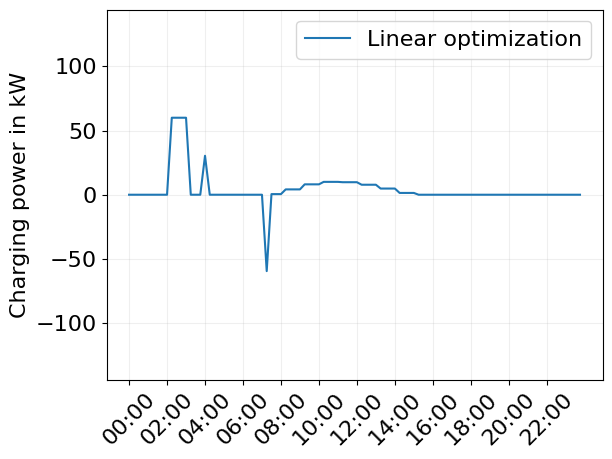

In [ ]:
lp.plot_benchmark(lp_log)

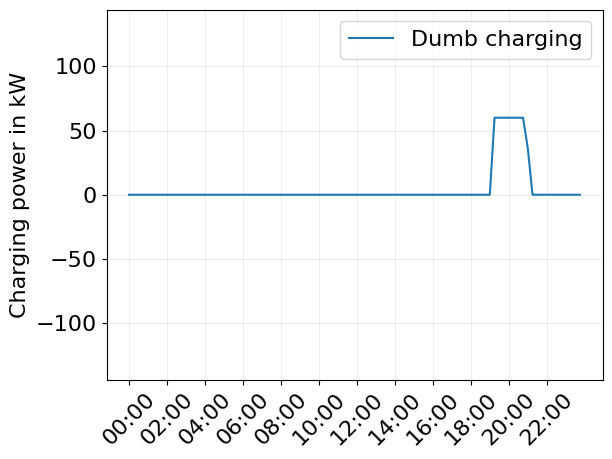

In [ ]:
uncontrolled_charging.plot_benchmark(uc_log)

This showcases some evaluation methods that have already been written for easy comparison
You can, of course, create new analytics from the log dataframes

RL reward: -156.1154570152694
DC reward: -166.90344517064852
RL cashflow: -24.114477744717327
DC cashflow: -24.355141943383796
                     Category  RL-based charging  benchmark charging
0                      Reward        -156.115457         -166.903445
1                    Cashflow         -24.114478          -24.355142
2  Average degradation per EV           0.000000            0.000000
3                 Overloading           0.000000            0.000000
4               SOC violation           0.000000            0.000000
5                # Violations           0.000000            0.000000
6                         SOH           1.000000            1.000000


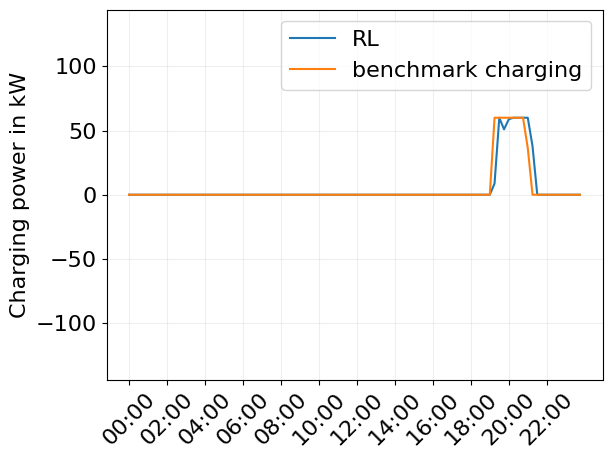

RL reward: -156.1154570152694
DC reward: -56.76506807018907
RL cashflow: -24.114477744717327
DC cashflow: -5.796533045905408
                     Category  RL-based charging  benchmark charging
0                      Reward        -156.115457          -56.765068
1                    Cashflow         -24.114478           -5.796533
2  Average degradation per EV           0.000000            0.000000
3                 Overloading           0.000000            0.000000
4               SOC violation           0.000000            0.050000
5                # Violations           0.000000            1.000000
6                         SOH           1.000000            1.000000


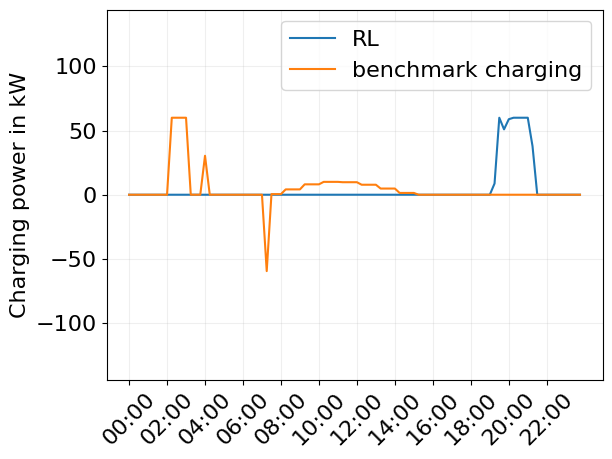

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/agent_eval/basic_evaluation.py:201: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels()[0:12])[0:12]


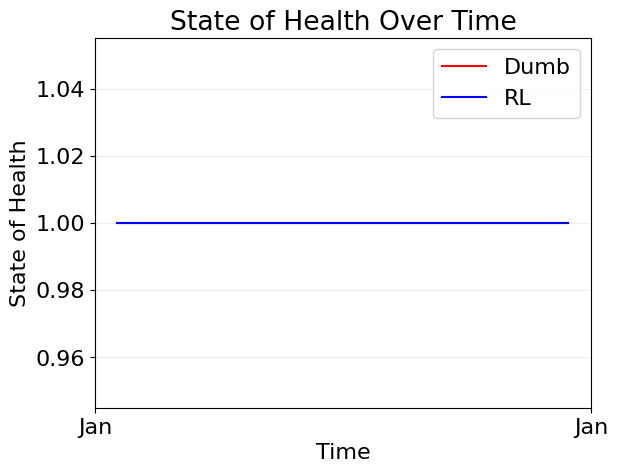

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/agent_eval/basic_evaluation.py:201: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels()[0:12])[0:12]


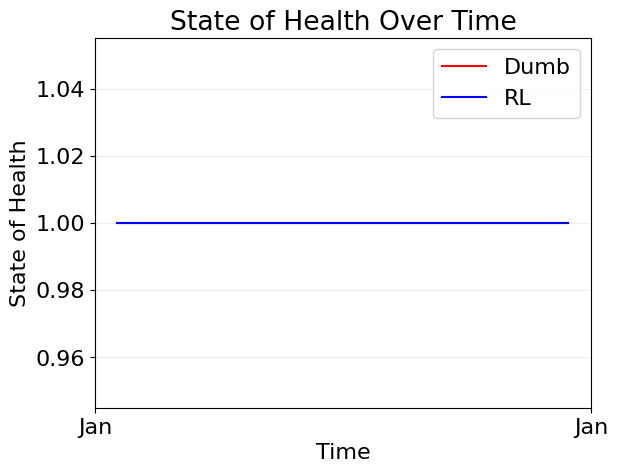

/Users/xiongzheng/program/tutorial/FleetRL/fleetrl/agent_eval/basic_evaluation.py:201: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels()[0:12])[0:12]


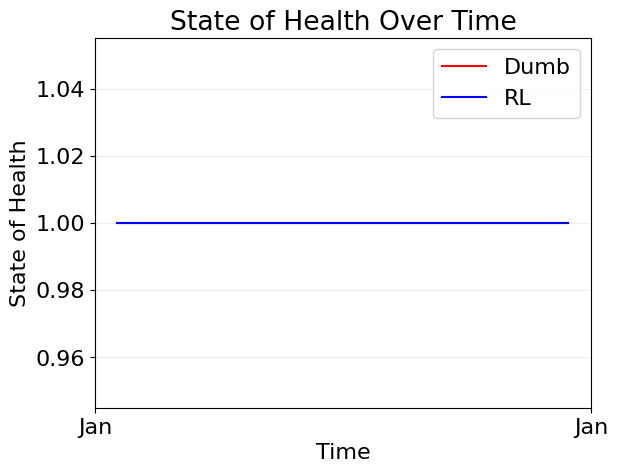

No violations found.


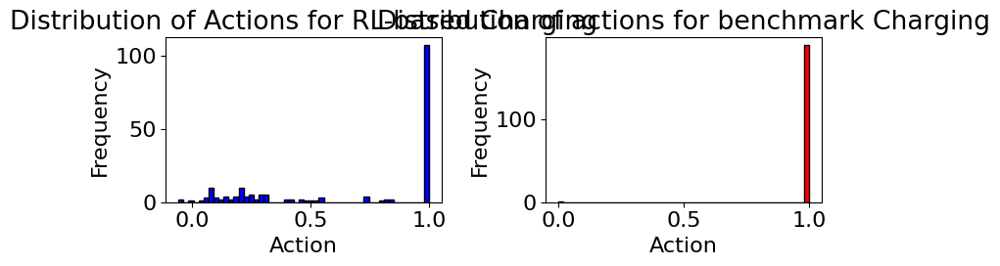

In [ ]:
eval.compare(rl_log=rl_log, benchmark_log=uc_log)
eval.compare(rl_log=rl_log, benchmark_log=lp_log)
eval.plot_soh(rl_log=rl_log, benchmark_log=uc_log)
eval.plot_soh(rl_log=rl_log, benchmark_log=dist_log)
eval.plot_soh(rl_log=rl_log, benchmark_log=night_log)
eval.plot_violations(rl_log=rl_log, benchmark_log=uc_log)
eval.plot_action_dist(rl_log=rl_log, benchmark_log=uc_log)

The detailed plot shows what is happening during certain days of the simulation. You can add as many benchmark logs as you have compiled, the figure will automatically adjust based on number of EVs, number of logs, etc.

In [ ]:
detailed_fig = eval.plot_detailed_actions(start_date='2021-01-01 00:00',
                                          end_date='2021-01-04 00:10',
                                          rl_log=rl_log,
                                          uc_log=uc_log,
                                          dist_log=dist_log,
                                          night_log=night_log)

detailed_fig.show()